In [1]:
! pip install opencv-python
! pip install ftfy regex tqdm
! pip install streamlit
! pip install torchray
! pip install torchvision

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import torch
from model import build_model
from clip_ import load, tokenize
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import streamlit as st
from torchray.attribution.grad_cam import grad_cam
from matplotlib import rc
import os
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
import matplotlib

In [3]:
torch.cuda.is_available()

False

In [4]:
def show_cam_on_image(img, mask, neg_saliency=False):
    if neg_saliency:
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_RAINBOW)
    else:
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return cam

def show_overlapped_cam(img, neg_mask, pos_mask):
    neg_heatmap = cv2.applyColorMap(np.uint8(255 * neg_mask), cv2.COLORMAP_RAINBOW)
    pos_heatmap = cv2.applyColorMap(np.uint8(255 * pos_mask), cv2.COLORMAP_JET)
    neg_heatmap = np.float32(neg_heatmap) / 255
    pos_heatmap = np.float32(pos_heatmap) / 255
    # try different options: sum, average, ...
    heatmap = neg_heatmap + pos_heatmap
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return cam

In [35]:
def interpret_vit(image, text, model, device, layer, neg_saliency=False, index=None):
    
    image_relevance, image = vit_relevance(image, text, model, device, neg_saliency=neg_saliency, index=index, layer=l)
    vis = show_cam_on_image(image, image_relevance, neg_saliency=neg_saliency)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)
    
    #plt.imshow(vis)

def interpret_vit_overlapped(image, text, model, device, index=None):
    
    pos_image_relevance, _ = vit_relevance(image, text, model, device, neg_saliency=False, index=index)
    neg_image_relevance, image = vit_relevance(image, text, model, device, neg_saliency=True, index=index)

    vis = show_overlapped_cam(image, neg_image_relevance, pos_image_relevance)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)

In [6]:
def rn_relevance(image, text, model, device, neg_saliency=False, index=None):   
    
    image_features = model.encode_image(image)
    text_features = model.encode_text(text)
    image_features_norm = image_features.norm(dim=-1, keepdim=True)
    image_features_new = image_features / image_features_norm
    text_features_norm = text_features.norm(dim=-1, keepdim=True)
    text_features_new = text_features / text_features_norm
    
    logit_scale = model.logit_scale.exp()
    logits_per_image = logit_scale * image_features_new @ text_features_new.t()
    probs = logits_per_image.softmax(dim=-1).cpu().detach().numpy().tolist()
    
    if neg:
        objective = -text_features_new
    else:
        objective = text_features_new
        
    objective = (objective * image_features_norm)
    image_relevance = grad_cam(model.visual, image.type(model.dtype), objective, saliency_layer=layer)
        


    image_relevance = image_relevance.reshape(1, 1, 7, 7)
    image_relevance = torch.nn.functional.interpolate(image_relevance, size=224, mode='bilinear')
    image_relevance = image_relevance.reshape(224, 224).cuda().data.cpu().numpy()
    image_relevance = (image_relevance - image_relevance.min()) / (image_relevance.max() - image_relevance.min())
    image = image[0].permute(1, 2, 0).data.cpu().numpy()
    image = (image - image.min()) / (image.max() - image.min())
    
    return image_relevance, image

In [7]:
def interpret_rn(image, text, model, device, neg_saliency=False, index=None):   
   
    image_relevance, image = rn_relevance(image, text, model, device, neg_saliency=neg_saliency, index=index)
    vis = show_cam_on_image(image, image_relevance, neg_saliency=neg_saliency)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)
    
def interpret_rn_overlapped(image, text, model, device, index=None):   
   
    pos_image_relevance, _ = rn_relevance(image, text, model, device, neg_saliency=False, index=index)
    neg_image_relevance, image = rn_relevance(image, text, model, device, neg_saliency=True, index=index)

    vis = show_overlapped_cam(image, neg_image_relevance, pos_image_relevance)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)

In [8]:
st.sidebar.header('Options')
alpha = st.sidebar.radio("select alpha", [0.5, 0.7, 0.8], index=1)
layer = st.sidebar.selectbox("select saliency layer", ['layer4.2.relu'], index=0)

device = "cuda" if torch.cuda.is_available() else "cpu"

model_rn, preprocess = load("RN50", device=device, jit=False)
model, preprocess = load("ViT-B/32", device=device, jit=False)

2021-12-03 09:10:05.100 
  command:

    streamlit run /home/mamooler/anaconda3/envs/DL/lib/python3.6/site-packages/ipykernel_launcher.py [ARGUMENTS]
/home/mamooler/anaconda3/envs/DL/lib/python3.6/site-packages/torchvision/transforms/transforms.py:258: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


In [9]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [10]:
def sim_score(model, image, texts):
        texts = tokenize(texts).to(device)
        logits_per_image, logits_per_text = model(image, texts)
        probs = logits_per_image.softmax(dim=-1).detach().cpu().numpy()

        return probs[0]

In [60]:
root = "../Images/"
img_ids = ["horse&dog.jpg", "horse&sheep.jpg", "cow&sheep.jpg", "happy_woman.jpg"]#, "vase_or_face.png", "duck-rabbit.jpeg"]

text_lists = [["a horse", "a dog"],
              ["a horse", "a sheep"],
              ["a cow", "a sheep"],
              ["a woman", "pink shirt"]]
# text_lists = [["a horse"],
#               ["a brown horse"],
#               ["a cow"],
#               ["a happy woman"]]

          

model_types = ["ViT"]

font = {
    'size': 10,
}

ori_preprocess = Compose([
        Resize((224), interpolation=Image.BICUBIC),
        CenterCrop(size=(224, 224)),
        ToTensor()])
print(preprocess)

Compose(
    Resize(size=224, interpolation=bicubic)
    CenterCrop(size=(224, 224))
    <function _transform.<locals>.<lambda> at 0x7fe8eb7189d8>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


In [61]:
def vit_relevance(image, text, model, device, layer, neg_saliency=False, index=None):
    t_text = tokenize(text).to(device)
    model.visual.eval()
    
    image_features = model.encode_image(image)

    image_features = model.encode_image(image)
    text_features = model.encode_text(t_text)

    image_features_norm = image_features.norm(dim=-1, keepdim=True)
    image_features_new = image_features / image_features_norm
    text_features_norm = text_features.norm(dim=-1, keepdim=True)
    text_features_new = text_features / text_features_norm
    
    similarity = image_features_new[0].dot(text_features_new[0])
 

    image_attn_blocks = list(dict(model.visual.transformer.resblocks.named_children()).values())
    num_tokens = image_attn_blocks[0].attn_probs.shape[-1]
    
    R = torch.eye(num_tokens, num_tokens, dtype=image_attn_blocks[0].attn_probs.dtype,requires_grad=False).to(device)
    cam = image_attn_blocks[layer].attn_probs
    cam = cam.mean(dim=0) 
    R += torch.matmul(cam, R)
        
    R[0, 0] = 0
    image_relevance = R[0, 1:]
    
    image_relevance = image_relevance.reshape(1, 1, 7, 7)
    image_relevance = torch.nn.functional.interpolate(image_relevance, size=224, mode='bilinear')
    image_relevance = image_relevance.reshape(224, 224)#.cpu().detach().numpy()
    image_relevance = (image_relevance - image_relevance.min()) / (image_relevance.max() - image_relevance.min())
    
    image = (image - image.min()) / (image.max() - image.min())
    
    #heatmap = np.float32(image_relevance) / 255
    cam = image_relevance * image
    cam = cam / torch.max(cam)
    masked_image_features = model.encode_image(cam)
    masked_image_features_norm = masked_image_features.norm(dim=-1, keepdim=True)
    masked_image_features_new = masked_image_features / masked_image_features_norm
    new_score = masked_image_features_new[0].dot(text_features_new[0])

    cam = cam[0].permute(1, 2, 0).data.cpu().numpy()

    plt.title(f"attn blk {layer} | {text} | score: {new_score}", **font, y=-0.15)
    plt.imshow(cam)
    

    image = image[0].permute(1, 2, 0).data.cpu().numpy()
    image = (image - image.min()) / (image.max() - image.min())
    return image_relevance.cpu().detach().numpy(), image


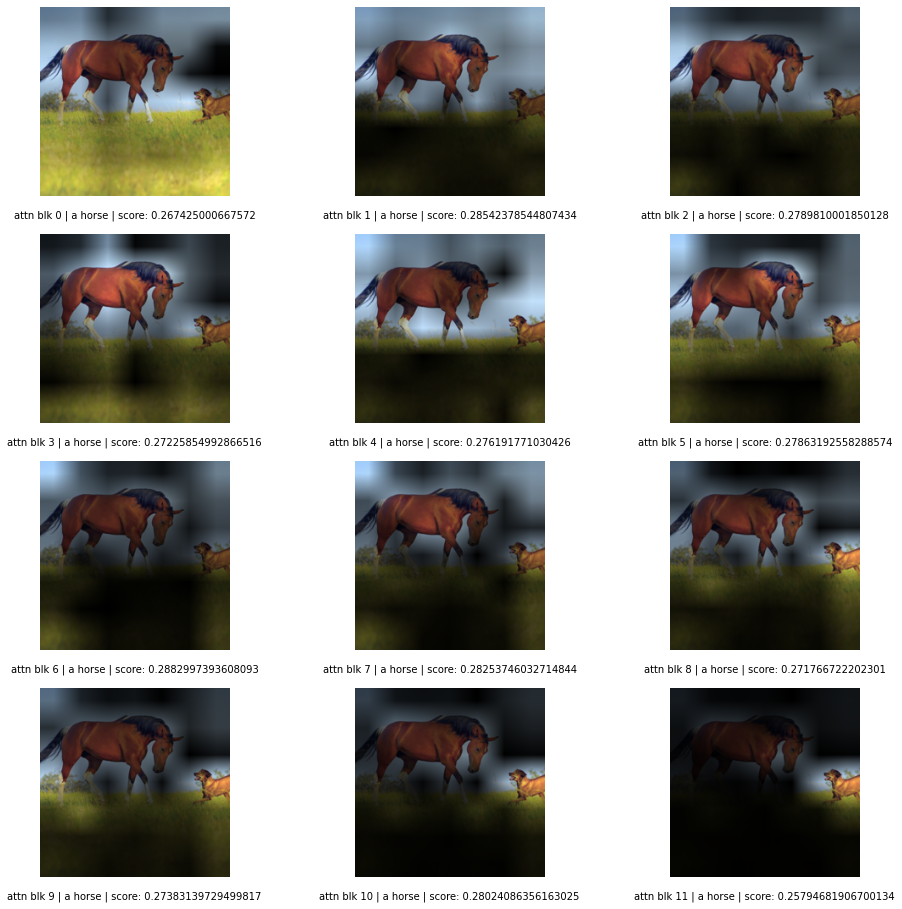

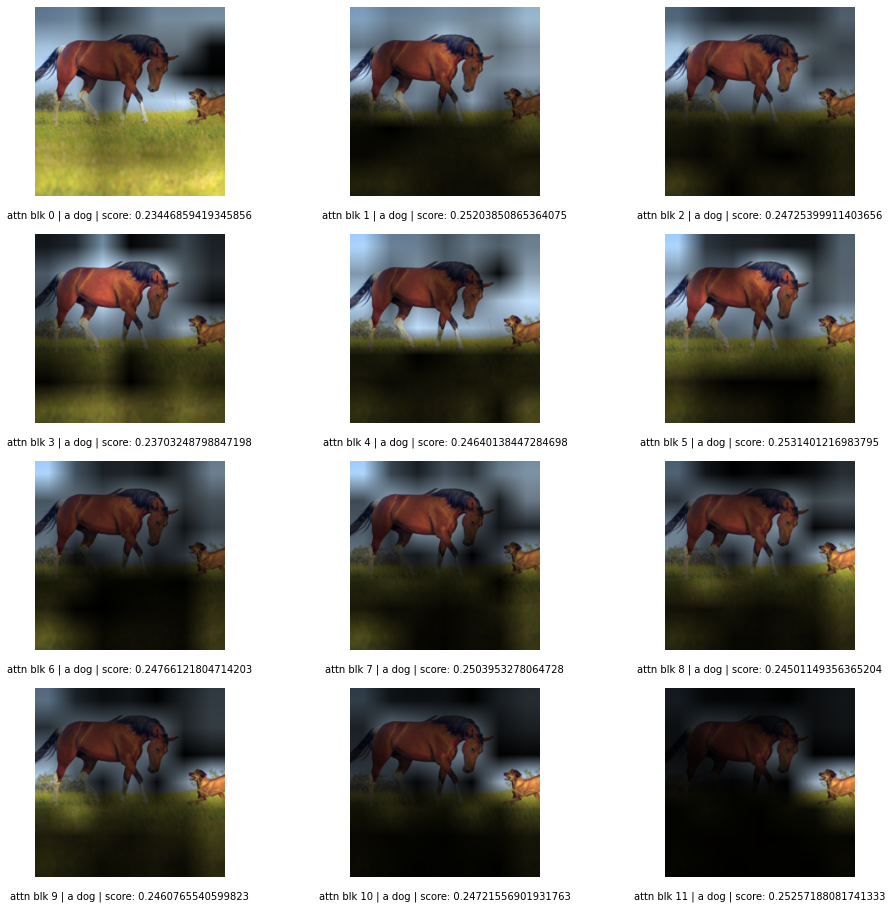

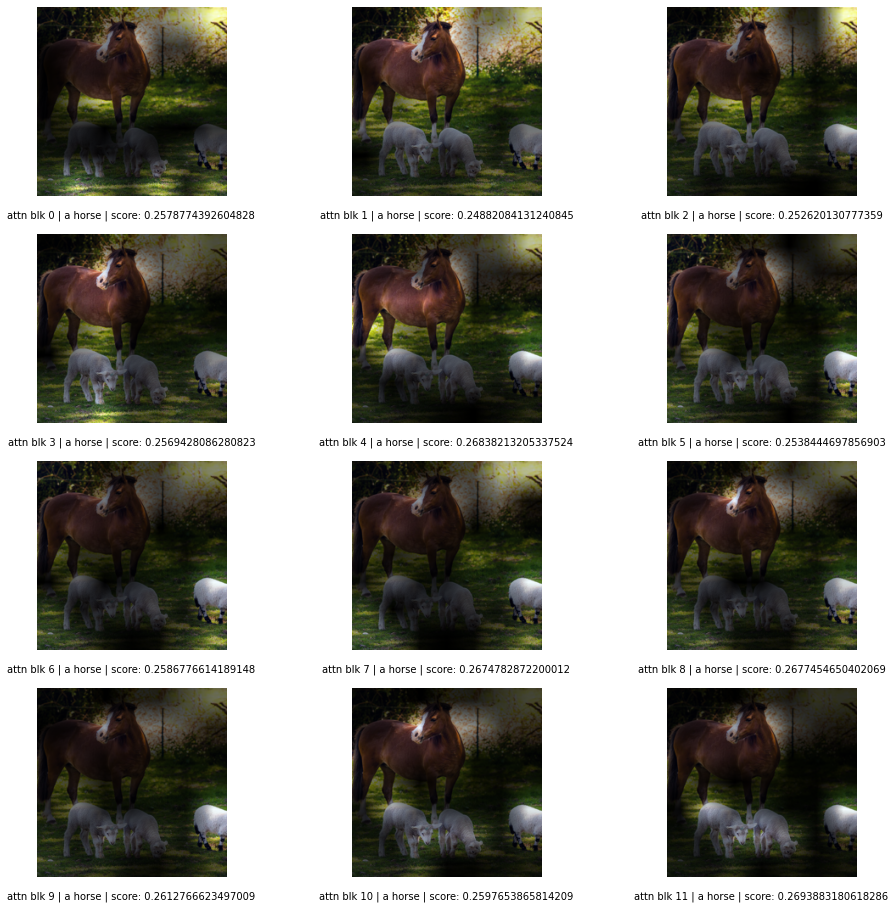

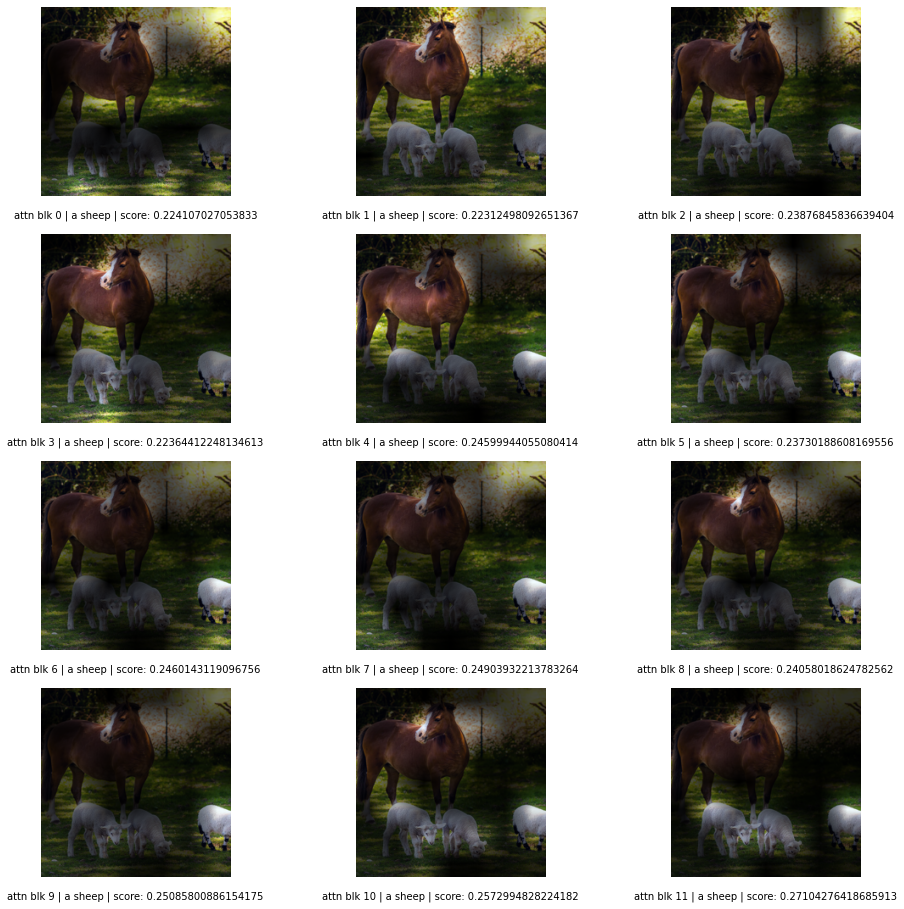

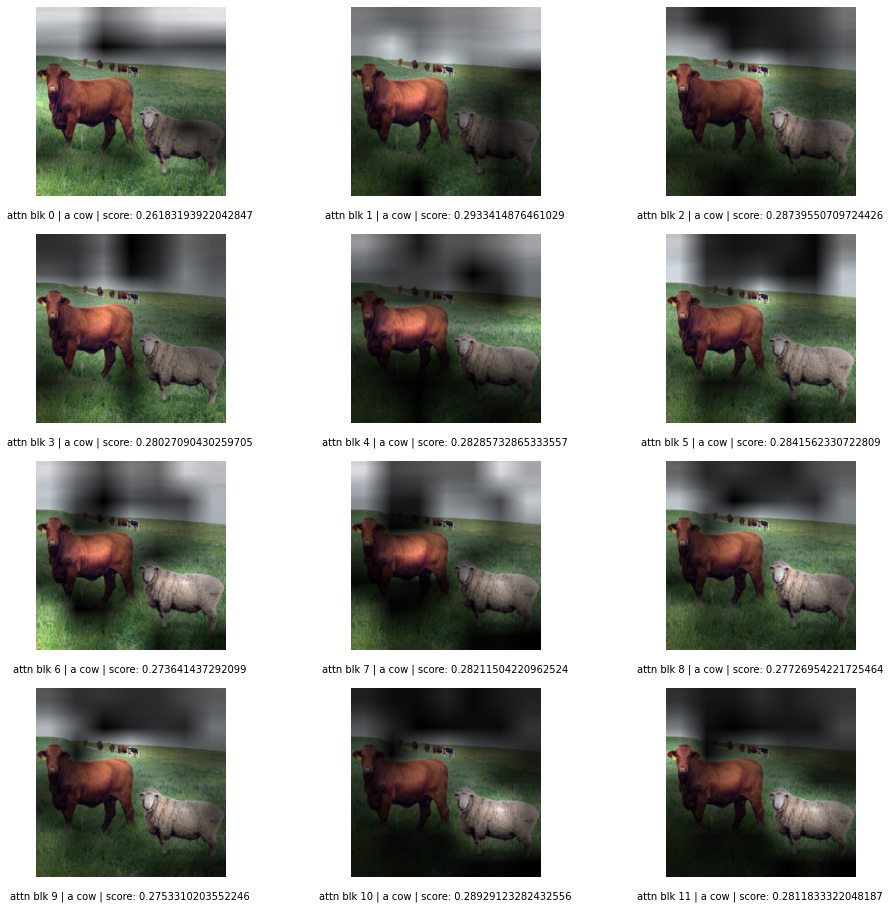

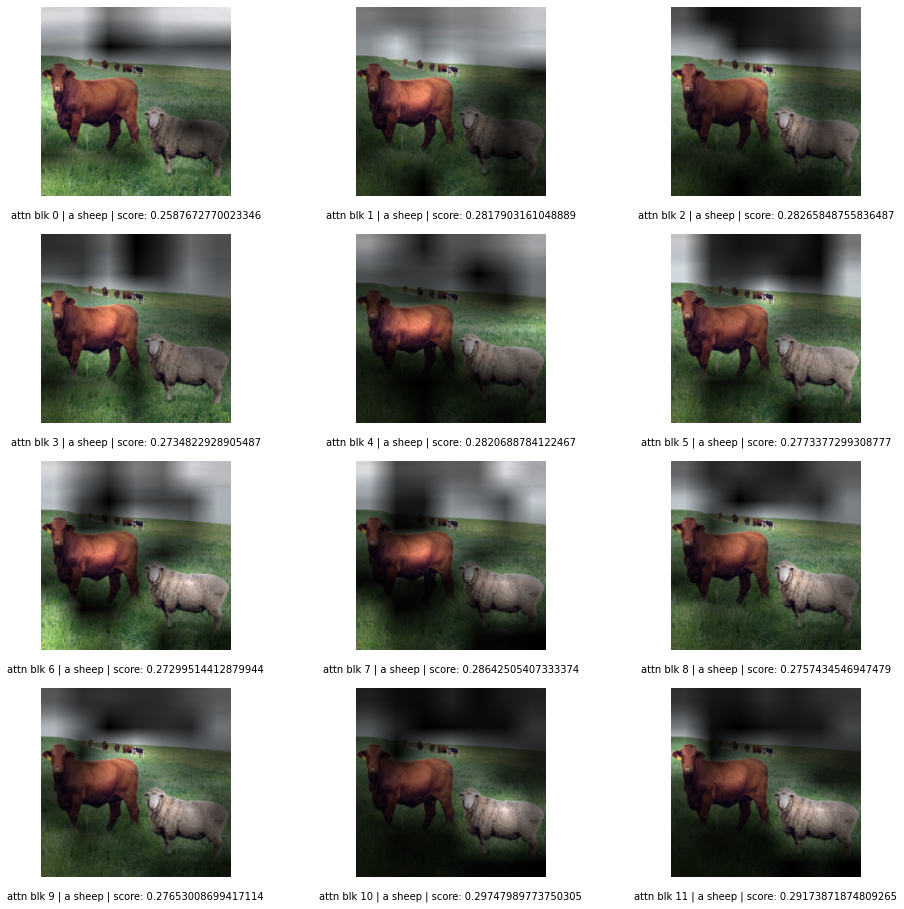

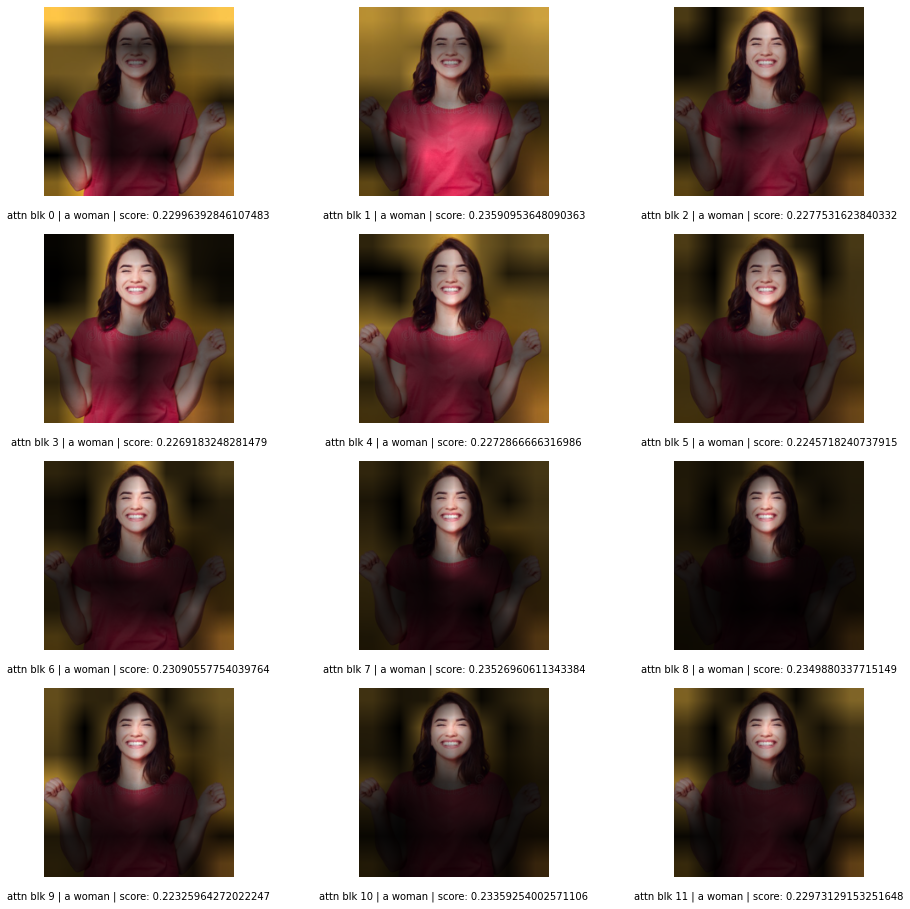

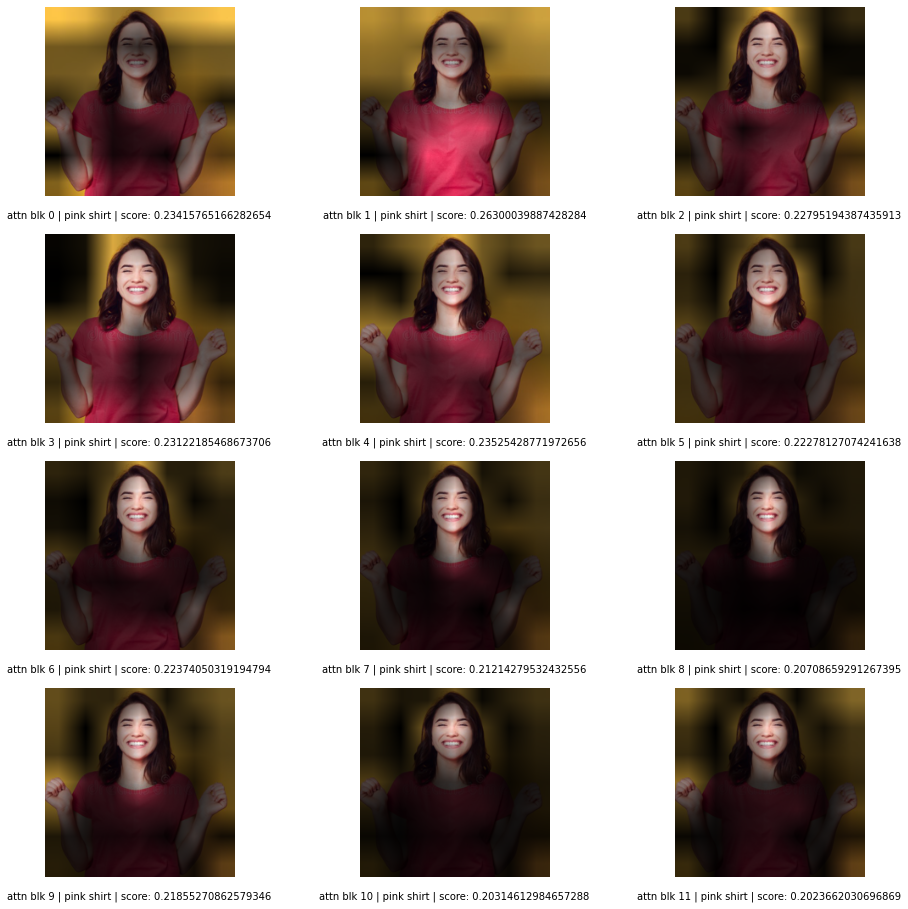

In [62]:
matplotlib.rcParams['mathtext.fontset'] = 'custom'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
# matplotlib.rcParams['mathtext.size'] = 16

#fig, ax = plt.subplots(len(2*img_ids), 3, figsize=(16,16))

for id_, img_id in enumerate(img_ids):
    texts = text_lists[id_]
    for t_id, text in enumerate(texts):
        t_text = tokenize(text).to(device)
            
        img_path =  os.path.join(root, img_id )
        image = ori_preprocess(Image.open(img_path))


        plt.figure(figsize=(16, 16))
        plt.tight_layout()
        # plt.subplot(4,3,1)
        # plt.imshow(image.permute(1, 2, 0))
        
        # if neg==None: caption = text+"\n overlapped  | blue:neg, red: pos"
        # elif neg==True: caption = text+"\n negative | blue: high, red: low"
        # else: caption = text+ "\n positive | blue:low, red:high"
        # plt.title(caption, **font, y=-0.15)
    
        p_image = preprocess(Image.open(img_path)).unsqueeze(0).to(device)

        subplot = 132
            
        for model_id, model_type in enumerate(model_types):
        
            if model_type=="ViT":
                for l in range(12):
                    plt.subplot(4,3,l+1)
                    plt.axis('off')
                    
                    interpret_vit(model=model, image=p_image, text=text, neg_saliency=False, device=device, index=0, layer=l)
                

In [ ]:
def vit_relevance(image, text, model, device, layer, neg_saliency=False, index=None):

    model.visual.eval()
    
    image_features = model.encode_image(image)
    text_features = model.encode_text(text)

    image_features_norm = image_features.norm(dim=-1, keepdim=True)
    image_features_new = image_features / image_features_norm
    text_features_norm = text_features.norm(dim=-1, keepdim=True)
    text_features_new = text_features / text_features_norm
    
    similarity = image_features_new[0].dot(text_features_new[0])
 
    # print(similarity)
    #model.visual.zero_grad()
    #objective.backward(retain_graph=True)
 
    image_attn_blocks = list(dict(model.visual.transformer.resblocks.named_children()).values())
    num_tokens = image_attn_blocks[0].attn_probs.shape[-1]
    
    R = torch.eye(num_tokens, num_tokens, dtype=image_attn_blocks[0].attn_probs.dtype,requires_grad=False).to(device)
    upsample = torch.nn.UpsamplingBilinear2d(
                size=image.shape[-2])
    
    scores = torch.zeros(len(image_attn_blocks))
    
    #n_image = (image - image.min()) / (image.max() - image.min())
    #n_image = image.unsqueeze(dim=1)

    cams = torch.zeros((12,12,50,50))
    for ind, blk in enumerate(image_attn_blocks):
        cam = blk.attn_probs
        cams[ind] = cam

    for ind, blk in enumerate(image_attn_blocks):
        cam = cams[ind].mean(dim=0)
        cam = cam.reshape(1, -1, cam.shape[-1], cam.shape[-1])
        cam = upsample(cam)
       
        cam = (cam-cam.min()) / (cam.max()-cam.min())     
        t = 0.09
        cam[cam>=t] = 1
        cam[cam<t] = 0

        masked_img = (image*cam)
        #plt.imshow(masked_img.detach()[0].permute(1, 2, 0))
        masked_features = model.encode_image(masked_img)
        masked_features_norm = masked_features.norm(dim=-1, keepdim=True)
        #masked_features_new = masked_features / masked_features_norm
        masked_sim = text_features[0].dot(masked_features[0])
        
        score =  masked_sim#-similarity 
        if neg_saliency:
            score *=-1
        scores[ind]=score
    
    scores = scores.clamp(min=0)
    print(scores)
    scores = torch.nn.Softmax(dim=-1)(scores)
    
    print(scores)
    print(scores)
    for ind,blk in enumerate(image_attn_blocks):
    
        cam = cams[ind]
        weight = scores[ind]
        cam = cam * weight
        cam = cam.clamp(min=0)
        cam = cam.mean(dim=0) 
        R += torch.matmul(cam, R)
        
    R[0, 0] = 0
    image_relevance = R[0, 1:]
    
    image_relevance = image_relevance.reshape(1, 1, 7, 7)
    image_relevance = torch.nn.functional.interpolate(image_relevance, size=224, mode='bilinear')
    image_relevance = image_relevance.reshape(224, 224).cpu().detach().numpy()
    image_relevance = (image_relevance - image_relevance.min()) / (image_relevance.max() - image_relevance.min())
    image = image[0].permute(1, 2, 0).data.cpu().numpy()
    image = (image - image.min()) / (image.max() - image.min())
    
    return image_relevance, image


a horse


TypeError: interpret_vit() got an unexpected keyword argument 'layer'

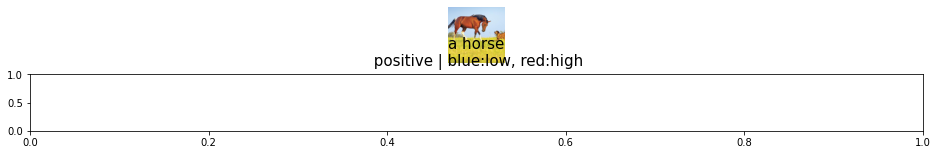

In [ ]:
matplotlib.rcParams['mathtext.fontset'] = 'custom'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
# matplotlib.rcParams['mathtext.size'] = 16

#fig, ax = plt.subplots(len(2*img_ids), 3, figsize=(16,16))

for id_, img_id in enumerate(img_ids):
    texts = text_lists[id_]
    for t_id, text in enumerate(texts):
        print(text)
        t_text = tokenize(text).to(device)
        
        for neg in [False, True]:#, None]:
            
            img_path =  os.path.join(root, img_id )
            image = ori_preprocess(Image.open(img_path))


            plt.figure(figsize=(16, 16))
            plt.tight_layout()
            plt.subplot(13,1,1)
            plt.imshow(image.permute(1, 2, 0))
            plt.axis('off')
            if neg==None: caption = text+"\n overlapped  | blue:neg, red: pos"
            elif neg==True: caption = text+"\n negative | blue: high, red: low"
            else: caption = text+ "\n positive | blue:low, red:high"
            plt.title(caption, **font, y=-0.15)
        
            p_image = preprocess(Image.open(img_path)).unsqueeze(0).to(device)

            subplot = 132
                
            for model_id, model_type in enumerate(model_types):
           
                
            
                if model_type=="ViT":
                    
                    if not neg==None:
                        for l in range(12):
                            plt.subplot(13,1,2+l)
                            interpret_vit(model=model, image=p_image, text=t_text, neg_saliency=neg, device=device, index=0, layer=l)
                    else:
                        interpret_vit_overlapped(model=model, image=p_image, text=t_text, device=device, index=0)

                else:
                        
                    if not neg==None:
                        interpret_rn(model=model_rn, image=p_image, text=t_text, neg_saliency=neg, device=device, index=0)
                    else:
                        interpret_rn_overlapped(model=model_rn, image=p_image, text=t_text, device=device, index=0)
                            
                

                plt.title(model_type, **font,y=-0.15)
                plt.tight_layout()
                plt.axis('off')

                # dir_path = f'comparison/img_text/'
                # if not os.path.exists(dir_path):
                #     os.mkdir(dir_path)
                # plt.savefig(f'{dir_path}{model_type}_{img_id}_vs_{t_id}.jpg', bbox_inches='tight')

a horse
tensor(0.2656, grad_fn=<DotBackward>)
tensor([26.8754, 28.7531, 27.1803, 25.4413, 27.0877, 25.3554, 26.4079, 27.6858,
        27.9822, 27.2306, 29.0787, 28.2505], grad_fn=<CopySlices>)
tensor([26.8754, 28.7531, 27.1803, 25.4413, 27.0877, 25.3554, 26.4079, 27.6858,
        27.9822, 27.2306, 29.0787, 28.2505], grad_fn=<CopySlices>)
tensor(0.2656, grad_fn=<DotBackward>)
tensor([-26.8754, -28.7531, -27.1803, -25.4413, -27.0877, -25.3554, -26.4079,
        -27.6858, -27.9822, -27.2306, -29.0787, -28.2505],
       grad_fn=<CopySlices>)
tensor([-26.8754, -28.7531, -27.1803, -25.4413, -27.0877, -25.3554, -26.4079,
        -27.6858, -27.9822, -27.2306, -29.0787, -28.2505],
       grad_fn=<CopySlices>)
sky
tensor(0.1878, grad_fn=<DotBackward>)
tensor([27.9994, 28.6151, 27.4214, 27.6323, 30.1600, 27.4459, 28.6574, 29.7761,
        29.2049, 28.0455, 28.9046, 28.6428], grad_fn=<CopySlices>)
tensor([27.9994, 28.6151, 27.4214, 27.6323, 30.1600, 27.4459, 28.6574, 29.7761,
        29.2049, 28.0

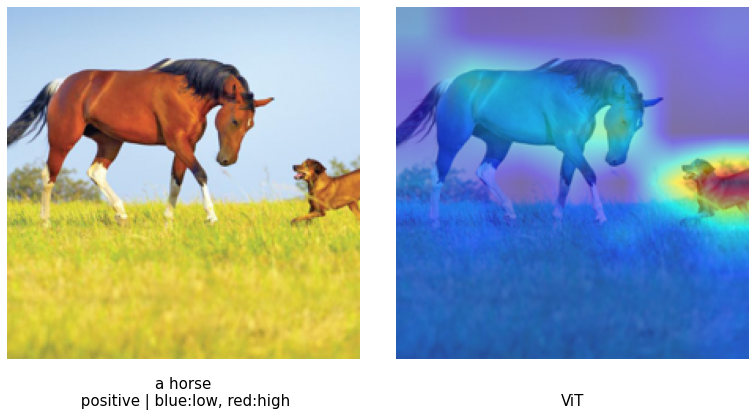

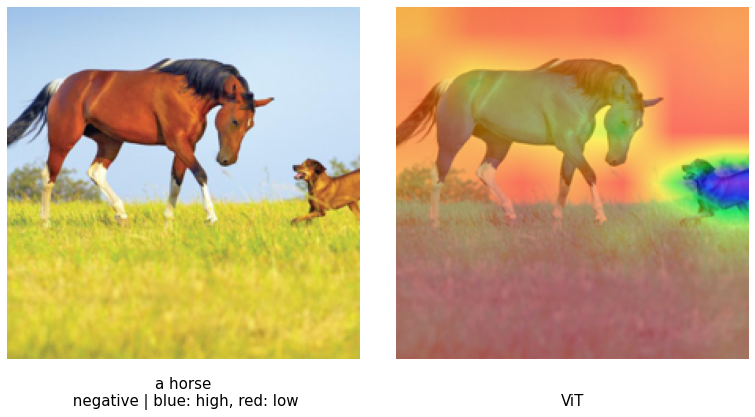

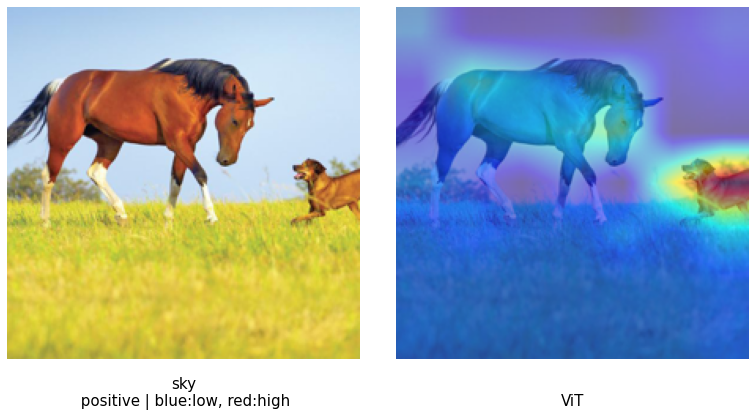

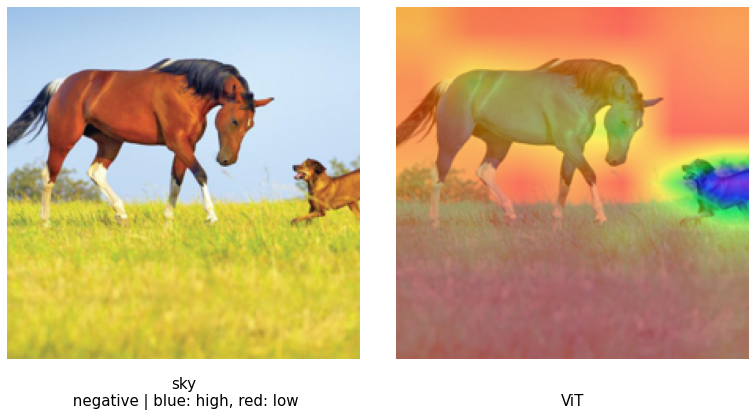

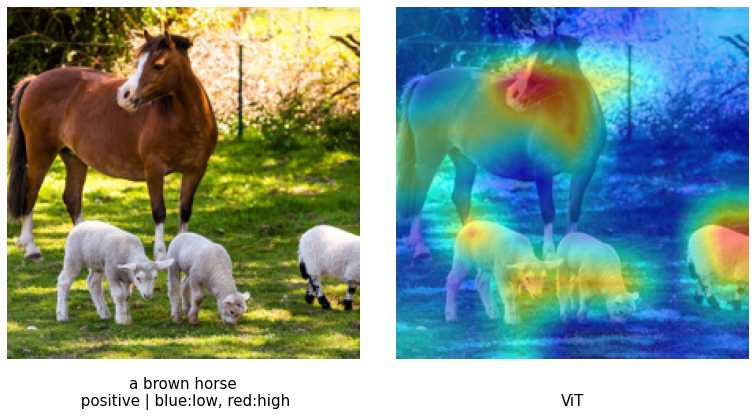

...

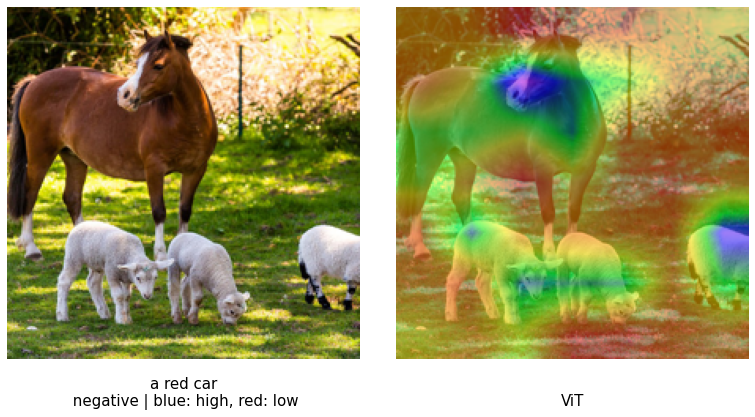

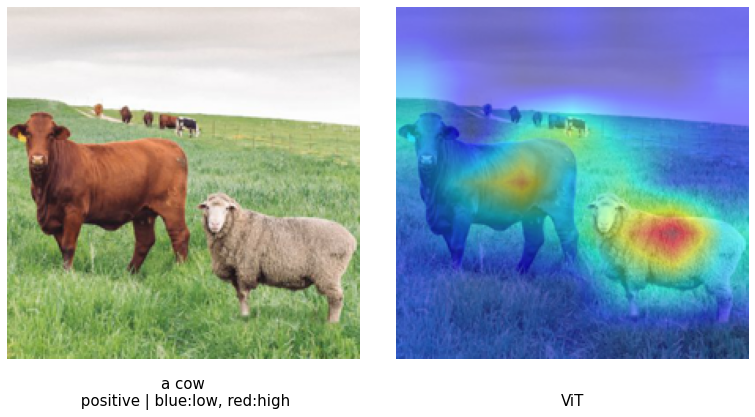

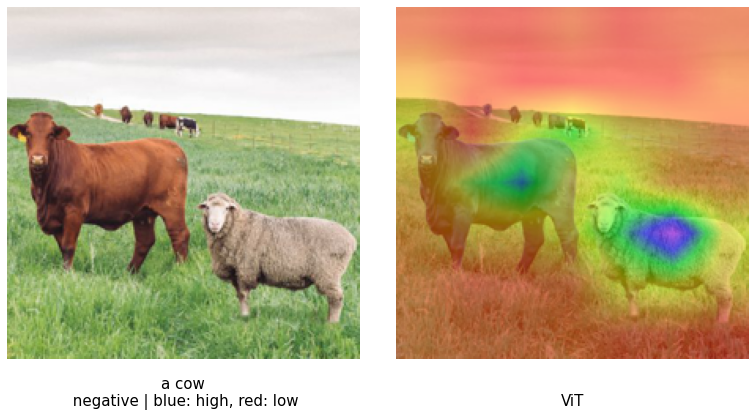

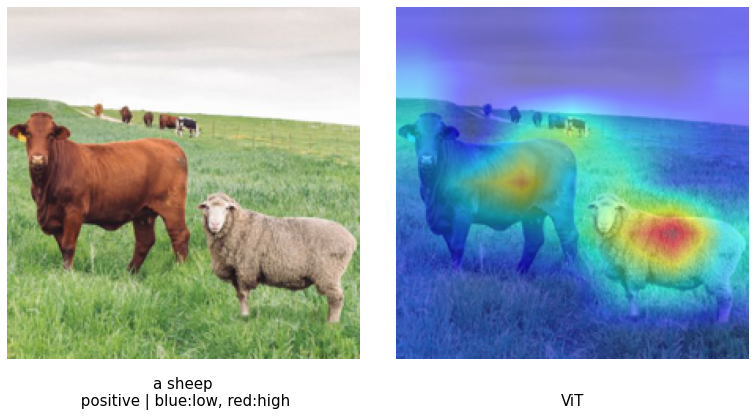

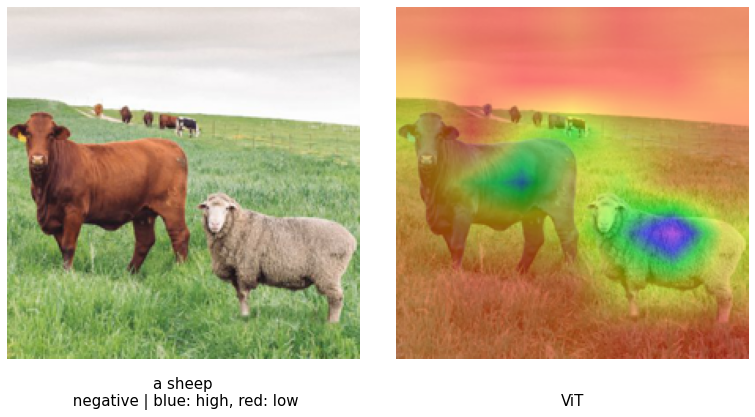